Machine Learning at its core is Just a Function. 


You have inputs and outputs with the variables being changes along the formula to change what happens with the outcome. 

For those of you unfamiliar with linear regression I have a link below to help catch you up.

Linear Regression is about finding a linear function (a line) that best fits the data given. 

There are two types of data that we came make fuctions learn


*   Classification:  **find a function of best fit that bounds the data or splits the data into distinct regions or categories** 
*   Regression: Finding the function of best fit for the data.

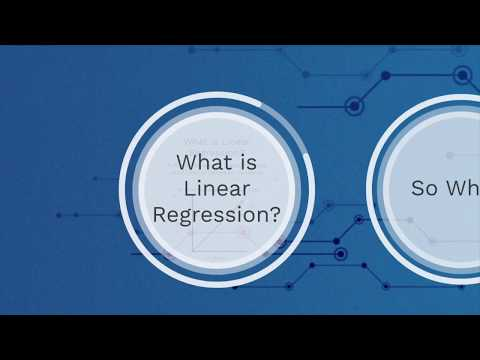

In [ ]:
"This is Linear Regression Explained very simply"

from IPython.display import YouTubeVideo

YouTubeVideo('iIUq0SqBSH0', width=800, height=300)

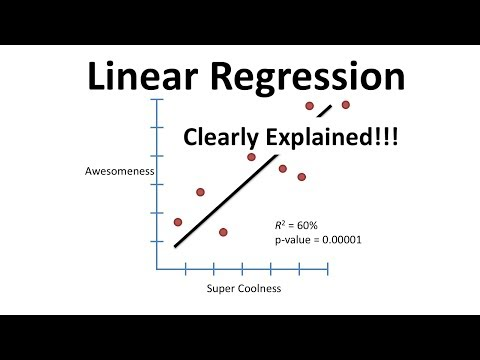

In [ ]:
"This is Linear Regression with an explaination on error"

from IPython.display import YouTubeVideo

YouTubeVideo('nk2CQITm_eo', width=800, height=300)

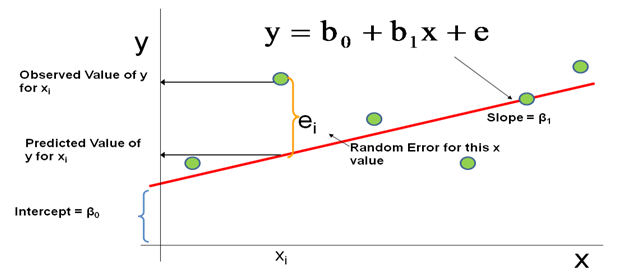

The error of a line is how close it fits the data points. You essentially add up the error (or the distance) from the line from all the points and that would be your total error of the function. 

**ANOTHER NAME FOR ERROR IS LOSS**

But what do you do do when the data is not linear like below?

While this data below is a classification problem (and is very decent split data ) this question of how to find a non-linear function to fit data is an interesting question.

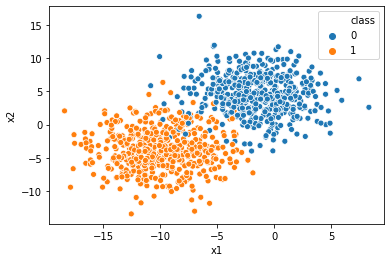

Do you make a line like this? This line would have a high error or loss. Wouldnt it be better to draw circles around these points to help lower the error?

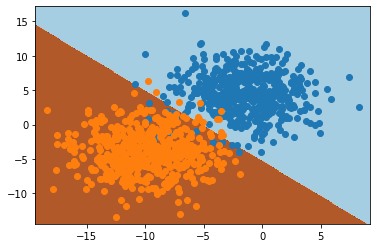

For the next little bit we will be viewing everything as just Classification problems to simplify but all of this will also apply to regression (number) problems as well.

With Machine Learning we actually will have two functions to work with to find the best function. You have the Function that represents the fit called the Objective Function, and the Loss Function which represents every function you could ever use to fit the data and its error. From Infinitley bad error to the best fit which would be the lowest error. By plotting the error of each line we can form a new graph that represents how and where to look for functions that better fit the data. The worse a function is in fitting the higher the error so we would want to find low points on this function.





***Key Term***: The Objective Function is the function that is created to be the boundry layers seperating each classification of that we want to predict, or with regression it is the line that fits, describes and predicts the data. 

***Key Term***: The Loss Function (or cost function) stems from us finding that function representing the boundry line to be as close to correctly classifing everything as possible. or with regression it is finding the line that fits.

##Lets dive into the Functions a bit more

To begin with we will be using a .csv file which seperates data with commas (excel cells is a common way to view this)
The data below is a BIG file with each row representing a Flower. 

Each flower has data on lengths and widths of its pedals and sepals and we can see a species that corresponds to it.

In [1]:
import pandas as pd
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
df = px.data.iris()
from sklearn.preprocessing import LabelEncoder

LE = LabelEncoder()
df['species_label'] = LE.fit_transform(df['species'])
df.tail()

,sepal_length,sepal_width,petal_length,petal_width,species,species_id,species_label
145,6.7,3.0,5.2,2.3,virginica,3,2
146,6.3,2.5,5.0,1.9,virginica,3,2
147,6.5,3.0,5.2,2.0,virginica,3,2
148,6.2,3.4,5.4,2.3,virginica,3,2
149,5.9,3.0,5.1,1.8,virginica,3,2


So lets take this data and make a plot of its petal_width and sepal_width with the color representing the flower type. 

In this case we can see that we could draw a boundry line (which if you were crazy enpough you could trial and error with real functions to find a function that fits the line you drew) that wraps around each type of flower which would classify at what point a change in width would be a change in flower type.

In [2]:
import plotly.express as px
fig = px.scatter(x=df.petal_width, y=df.sepal_width, color = df.species_label)
fig.show()

But our data has more points than that. we have 4 points of data or variables which we could represent on paper as letters like x or z, and our classification, lets all it (y). So instead of a 2 dimensional y=x we have y=x+z+a+s which is 4th dimensional?!?! 

We cant even imagine things in that dimension! Luckily for us Algorithms dont care how many dimensions it needs to make a function in. It could do it with 1,000,000 variables which would be 1,000,000 dimensions. Which would be very slow and nearly impossible but technically usable.

In [3]:
z = df[['sepal_length','sepal_width','species']]
fig = go.Figure(data =[go.Scatter3d(x=df.sepal_length, y=df.sepal_width, z=df.petal_width,
                                  mode ='markers', 
                                   marker = dict(
                                     size = 12,
                                     color = df['species_label'],
                                     colorscale ='Viridis',
                                     opacity = 0.8))])
fig.update_layout(scene = dict(
                    xaxis_title='sepal_length',
                    yaxis_title='sepal_width',
                    zaxis_title='petal_width'))


fig.show()

Something else to note is that with a 2 dimentional plot we only need a 1 dimentional line to split the data. With 3 dimensions above we will need a function in 2 dimensions or creating a sheet-like boundry that wraps between the points. In 4 dimensions you would need a 3rd dimension function and so on.

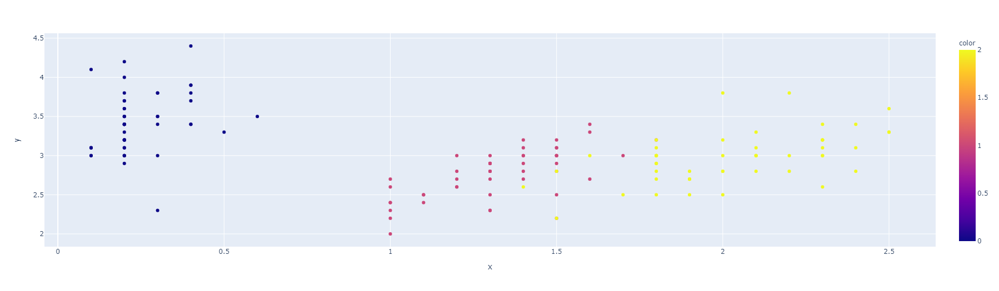

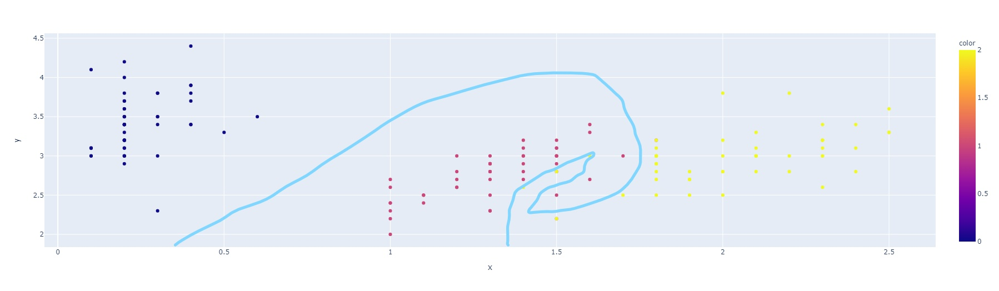

So what would the loss look like for this 2 dimentional slice of the data?
This is a bit tough to describe but the loss would be a representation of every function you could create within the parameters that the function could have plotted within another function. each time you slightly change a parameter (for example an x or y you would have a new point representing a new function infinitley small) in the case of two parameters you would need 3 dimentions because that third parameter z in this case represents how good or bad the error is for those parameters. Below we can see a 3d graph that is not an actual representation of the loss of 2 dimentional data but is a decent place to start

In [4]:
import plotly.graph_objects as go

fig = go.Figure(go.Surface(
    contours = {
        "x": {"show": True, "start": 0, "end": 2, "size": 0.04, "color":"white"},
        "z": {"show": True, "start": -2, "end": 2, "size": .1}
    },
    x = [1,2,3,4,5],
    y = [1,2,3,4,5],
    z = [
        [0, 1, 0, 1, .1],
        [1, .5, 1, 0, 1],
        [0, 1, -2, 1, 0],
        [1, 0, 1, 2, 1],
        [0, 1, 0, 1, 0]
    ]))
fig.update_layout(
        scene = {
            "xaxis": {"nticks": 20},
            "zaxis": {"nticks": 4},
            'camera_eye': {"x": 0, "y": -1, "z": 0.5},
            "aspectratio": {"x": 1, "y": 1, "z": 0.2}
        })
fig.show()

In [5]:
import plotly.graph_objects as go

fig = go.Figure(go.Surface(
    contours = {
        "x": {"show": True, "start": 0, "end": 2, "size": 0.04, "color":"white"},
        "z": {"show": True, "start": -2, "end": 2, "size": .1}
    },
    x = [1,2,3,4,5],
    y = [1,2,3,4,5],
    z = [
        [0, 1, 0, 1, .1],
        [1, .5, 1, 0, 1],
        [0, 1, -2, 1, 0],
        [1, 0, 1, 2, 1],
        [0, 1, 0, 1, 0]
    ]))
fig.update_layout(
        scene = {
            "xaxis": {"nticks": 20},
            "zaxis": {"nticks": 4},
            'camera_eye': {"x": 0, "y": 0, "z": 1},

        })
fig.show()

https://towardsdatascience.com/a-visual-explanation-of-gradient-descent-methods-momentum-adagrad-rmsprop-adam-f898b102325c

momentum

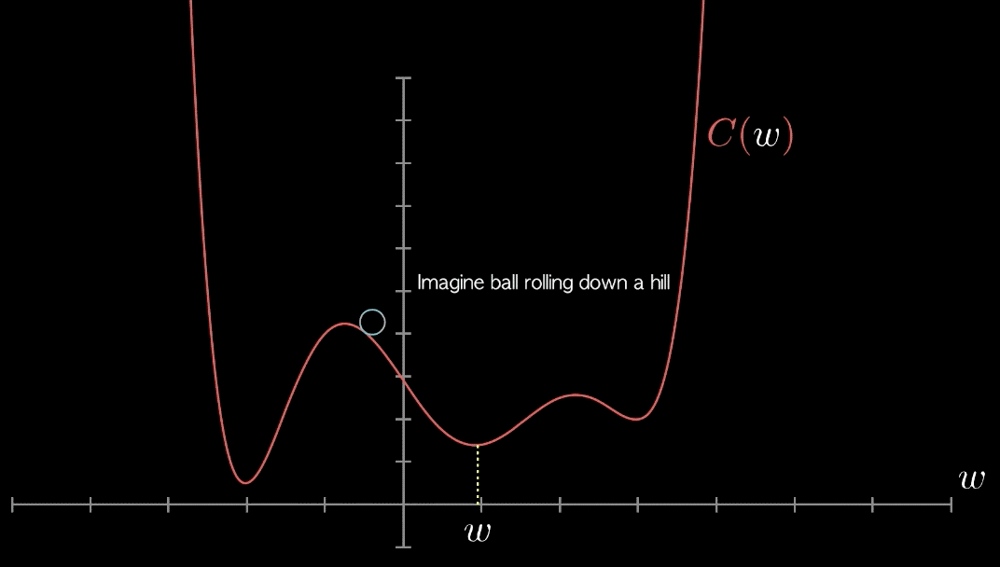

Learning Rate is instead the porportion of jump we take given the Gradient (with varying angles in the dimension of the loss as well we dont straight down the gradient) 

It is basically how far arewe looking ahead and in what direction?

RMSprop uses near exclusivley Learning Rate while SGD uses mainly this idea of  Momentum.
The difference lies in how learning rate is how far ahead we are looking while Momentum changes the step given its current location.


Adam is special because it uses both this idea of momentum and a varying learning rate

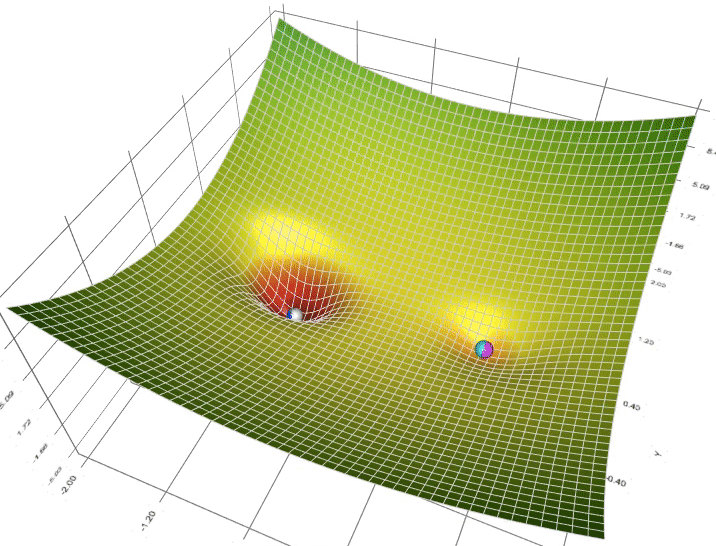

Animation of 5 gradient descent methods on a surface: gradient descent (cyan), momentum (magenta), AdaGrad (white), RMSProp (green), Adam (blue). Left well is the global minimum; right well is a local minimum.

Adam can be looked at as a combination of RMSprop and Stochastic Gradient Descent with momentum. It uses the squared gradients to scale the learning rate like RMSprop and it takes advantage of momentum by using moving average of the gradient instead of gradient itself like SGD with momentum.

In [ ]:
!pip install np_utils

     |████████████████████████████████| 61 kB 3.0 MB/s 
  Created wheel for np-utils: filename=np_utils-0.5.12.1-py3-none-any.whl size=57131 sha256=d4494f6c67895245e09884897c32c196d24639c5cd8d3751507807ca20803266
  Stored in directory: /root/.cache/pip/wheels/8c/4e/ef/095c24693723c329f4cdc1079861cdbb2487d4b41b2496a4e7
Successfully built np-utils


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize
import tensorflow as tf
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense,Activation,Dropout 
from tensorflow.keras.layers import BatchNormalization 
from tensorflow.keras import utils as np_utils
from pandas import factorize

In [ ]:

from sklearn.datasets import load_iris
from sklearn.preprocessing import OneHotEncoder
from tensorflow.keras.optimizers import Adam

iris_data = load_iris() # load the iris dataset

print('Example data: ')
print(iris_data.data[:5])
print('Example labels: ')
print(iris_data.target[:5])

x = iris_data.data
y_ = iris_data.target.reshape(-1, 1) # Convert data to a single column

# One Hot encode the class labels
encoder = OneHotEncoder(sparse=False)
y = encoder.fit_transform(y_)
#print(y)

# Split the data for training and testing
train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.20)

# Build the model

model = Sequential()

model.add(Dense(10, input_shape=(4,), activation='relu', name='fc1'))
model.add(Dense(10, activation='relu', name='fc2'))
model.add(Dense(3, activation='softmax', name='output'))

# Adam optimizer with learning rate of 0.001
optimizer = Adam(lr=0.001)
model.compile(optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

print('Neural Network Model Summary: ')
print(model.summary())

# Train the model
model.fit(train_x, train_y, verbose=2, batch_size=5, epochs=200)

# Test on unseen data

results = model.evaluate(test_x, test_y)

print('Final test set loss: {:4f}'.format(results[0]))
print('Final test set accuracy: {:4f}'.format(results[1]))

Example data: 
[[5.1 3.5 1.4 0.2]
 [4.9 3.  1.4 0.2]
 [4.7 3.2 1.3 0.2]
 [4.6 3.1 1.5 0.2]
 [5.  3.6 1.4 0.2]]
Example labels: 
[0 0 0 0 0]
Neural Network Model Summary: 
Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 fc1 (Dense)                 (None, 10)                50        
                                                                 
 fc2 (Dense)                 (None, 10)                110       
                                                                 
 output (Dense)              (None, 3)                 33        
                                                                 
Total params: 193
Trainable params: 193
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/200


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning:

The `lr` argument is deprecated, use `learning_rate` instead.



24/24 - 1s - loss: 1.3402 - accuracy: 0.3500 - 602ms/epoch - 25ms/step
Epoch 2/200
24/24 - 0s - loss: 1.0749 - accuracy: 0.5167 - 31ms/epoch - 1ms/step
Epoch 3/200
24/24 - 0s - loss: 0.9342 - accuracy: 0.6667 - 32ms/epoch - 1ms/step
Epoch 4/200
24/24 - 0s - loss: 0.8502 - accuracy: 0.7000 - 46ms/epoch - 2ms/step
Epoch 5/200
24/24 - 0s - loss: 0.7863 - accuracy: 0.7500 - 36ms/epoch - 1ms/step
Epoch 6/200
24/24 - 0s - loss: 0.7368 - accuracy: 0.7000 - 36ms/epoch - 2ms/step
Epoch 7/200
24/24 - 0s - loss: 0.6899 - accuracy: 0.7417 - 40ms/epoch - 2ms/step
Epoch 8/200
24/24 - 0s - loss: 0.6480 - accuracy: 0.8500 - 31ms/epoch - 1ms/step
Epoch 9/200
24/24 - 0s - loss: 0.6075 - accuracy: 0.8750 - 44ms/epoch - 2ms/step
Epoch 10/200
24/24 - 0s - loss: 0.5732 - accuracy: 0.8167 - 41ms/epoch - 2ms/step
Epoch 11/200
24/24 - 0s - loss: 0.5401 - accuracy: 0.8583 - 36ms/epoch - 1ms/step
Epoch 12/200
24/24 - 0s - loss: 0.5093 - accuracy: 0.9333 - 39ms/epoch - 2ms/step
Epoch 13/200
24/24 - 0s - loss: 0.4

Derivitive Free optimization

How to you decent this Gradient of the Loss if you dont even know what the loss function is? 
You obviously would want to do better than random guessing... right??? well it turns out that guessing randomly is definitely better than not guessing (shocker). What we really need to do is make Educated Random Guessing. Lets look at an example of a more noisy 3rd dimentional loss function below

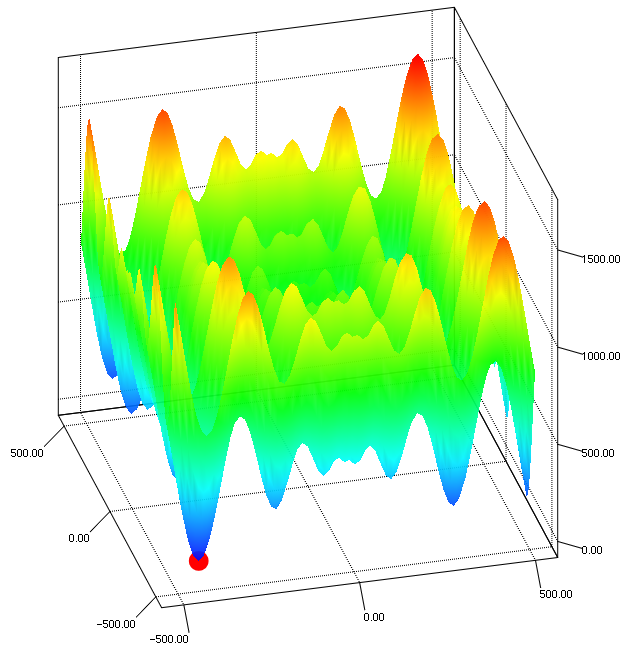

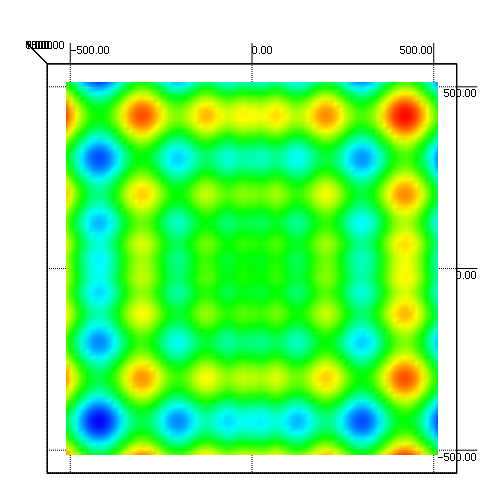

If we just look at it from an aerial veiw our original derivitive based method of traversing the loss for 1 epoch (training loop in a way) or even batch may look like below

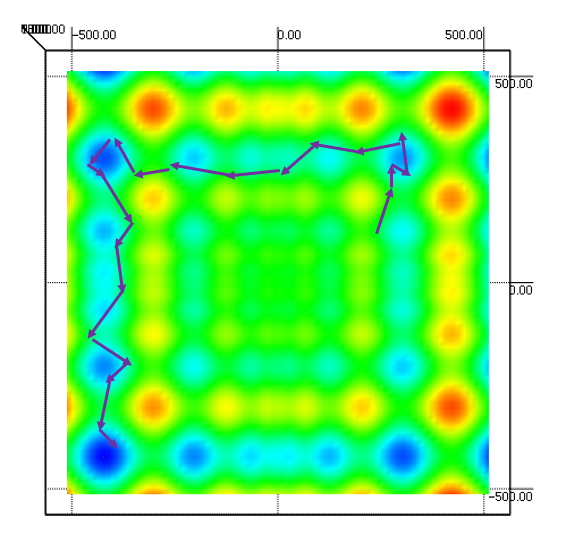

While randomly guessing for a first guess may look like this. Now it should be obvious that one of the downsides is if your guesses are too far apart you could miss a minima that is the best because you overlooked it. That is something Derivitive based optimization is better at than this derivitive free method.

One of the things we do though is when we make a guess is Try to mimic Evolution which i will stick to for now since it is easy to wrap your head around. there are many methods though
Lets allow the top lets say... 20 guesses to reproduce and mutate and change its parameters slightly. that may look like the second photo here. Than the best 20 or so again would get to reproduce and mutate and we will find a decent local minima (the hope is finding the best)

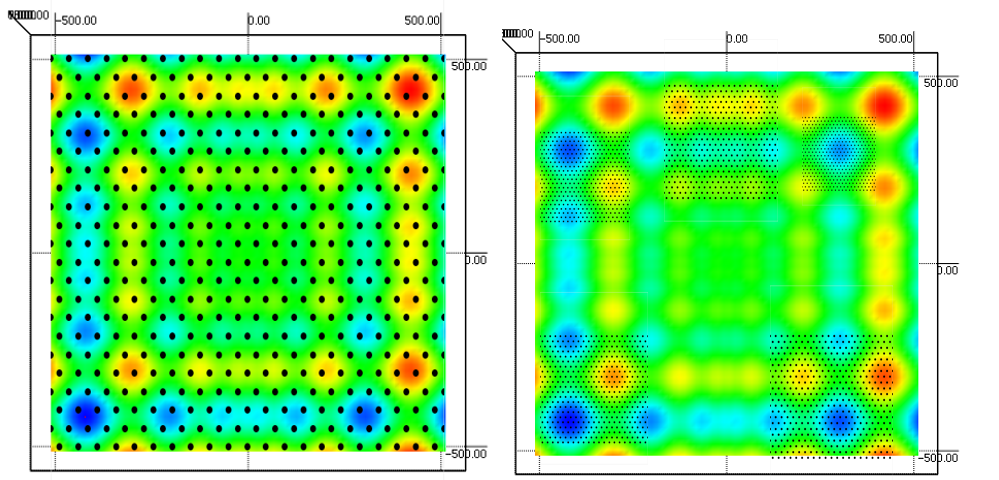

So lets see how we would program this. You can see the neural network is the same as the one aboe. the only thing that we changes is our optimizer.

In [ ]:
!pip install nevergrad
!pip install evolutionary-keras

We have the potential to use 2 different derivitave free optimizers below
Covariance Matrix Adaptation Evolution Strategy 
or
Nodal Genetic Algorithm
Similarly to Gradient Decent we can vastly change how the algorithm acts by changing the size around the node to look for even better gradients or how we adapt and mutate (adding random points in case we missed somethign earlier)

In [ ]:
import sys
import tensorflow as tf
from tensorflow.keras.datasets import mnist
from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Input, Flatten
from evolutionary_keras.models import EvolModel
import evolutionary_keras.optimizers
x = iris_data.data
y_ = iris_data.target.reshape(-1, 1) # Convert data to a single column

# One Hot encode the class labels
encoder = OneHotEncoder(sparse=False)
y = encoder.fit_transform(y_)
y = np.argmax(y, axis=1)
#print(y)

# Split the data for training and testing
train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.20)

inputs = Input(shape=(4,))
flatten = Flatten()(inputs)
dense = Dense(10, activation="relu")(flatten)
dense = Dense(10, activation="relu")(dense)
prediction = Dense(3, activation="softmax")(dense)

model = EvolModel(inputs=inputs, outputs=prediction)

if sys.argv[-1] == "cma":
    myopt = evolutionary_keras.optimizers.CMA(population_size=50, sigma_init=15)
    epochs = 1
else:
    myopt = evolutionary_keras.optimizers.NGA(population_size=20, sigma_init=15)

print(" > Compiling the model")
model.compile(optimizer=myopt, loss="sparse_categorical_crossentropy", metrics=["accuracy"])
model.summary()

print(" > Fitting")
history = model.fit(
    x=X_train,
    y=y_train,
    batch_size=40,
    epochs=200

    # validation_data=(x_test, y_test)
)
score = model.evaluate(x=test_x, y=test_y, return_dict=True, verbose=0)

print("Test loss:", score['loss'])
print("Test accuracy:", score['accuracy'])

 > Compiling the model
Model: "evol_model_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_25 (InputLayer)       [(None, 4)]               0         
                                                                 
 flatten_26 (Flatten)        (None, 4)                 0         
                                                                 
 dense_106 (Dense)           (None, 10)                50        
                                                                 
 dense_107 (Dense)           (None, 10)                110       
                                                                 
 dense_108 (Dense)           (None, 3)                 33        
                                                                 
Total params: 193
Trainable params: 193
Non-trainable params: 0
_________________________________________________________________
 > Fitting
Test loss: 816.967834

A Big place Derivitive Free optimization can play a role is tuning hyperparameters! 

Think about this. With GridSearches where we test all parameters in a Range and a Random Grid search (which pretty well describes derivitive free optimization)are we not exploring some unknown loss function of the optimizer? We can essentially Optimize an Optimizer because it in of itself will have an ideal state that affects the algorithm. Which is a mind-bending idea and is VERY slow to run (its at least O(n^2) but it is possible to optimize an optimizer by using derivitive free optimization.

# Questions

In what situations would you want to use a Derivitive Free optimizer?

Why did I include a loss function above if it is a derivitive free optimizer?